In [1]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

In [2]:
IMAGE_SIZE=256
BATCH_SIZE=32
CHANNELS=3
EPOCHS=50

In [3]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [4]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 4627 files belonging to 5 classes.


In [5]:
class_names=dataset.class_names
class_names

['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy']

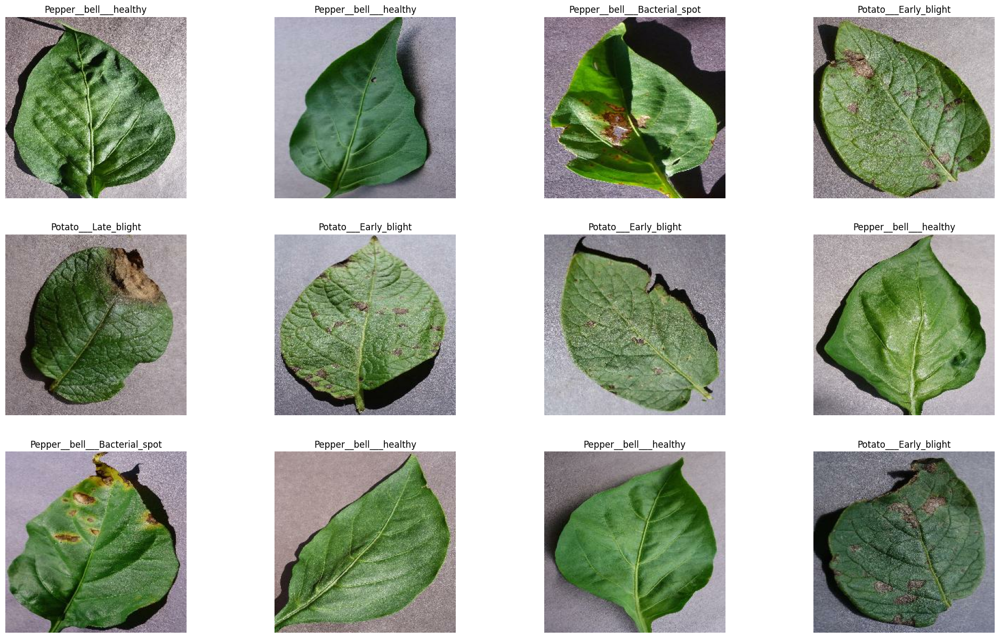

In [12]:
plt.figure(figsize=(25,15))
for image_batch,label_batch in dataset.take(1):
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [10]:
def get_dataset_partition(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=10000):
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
    ds_size=len(ds)
    train_size=int(ds_size*train_split)
    val_size=int(ds_size*val_split)
    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)
    return train_ds,val_ds,test_ds

In [7]:
train_ds,val_ds,test_ds=get_dataset_partition(dataset)

In [8]:
print(len(train_ds),len(val_ds),len(test_ds))

116 14 15


In [9]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [39]:
resize_and_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [40]:
data_agumentation=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [52]:
input_shape=(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes=5
model=models.Sequential([
    resize_and_rescale,
    data_agumentation,
    layers.Conv2D(32,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(n_classes,activation='softmax'),
    
    
])
model.build(input_shape=input_shape)

In [53]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 sequential_4 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                  

In [40]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [55]:
history=model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)
history

Epoch 1/50
116/116 [==============================] - 244s 2s/step - loss: 1.3615 - accuracy: 0.3888 - val_loss: 1.0602 - val_accuracy: 0.6138
Epoch 2/50
116/116 [==============================] - 189s 2s/step - loss: 0.8181 - accuracy: 0.6845 - val_loss: 0.6633 - val_accuracy: 0.7609
Epoch 3/50
116/116 [==============================] - 158s 1s/step - loss: 0.5010 - accuracy: 0.8310 - val_loss: 0.3095 - val_accuracy: 0.9057
Epoch 4/50
116/116 [==============================] - 137s 1s/step - loss: 0.2816 - accuracy: 0.9024 - val_loss: 0.2639 - val_accuracy: 0.9149
Epoch 5/50
116/116 [==============================] - 133s 1s/step - loss: 0.2109 - accuracy: 0.9289 - val_loss: 0.2438 - val_accuracy: 0.9126
Epoch 6/50
116/116 [==============================] - 133s 1s/step - loss: 0.1597 - accuracy: 0.9508 - val_loss: 0.1604 - val_accuracy: 0.9356
Epoch 7/50
116/116 [==============================] - 130s 1s/step - loss: 0.1489 - accuracy: 0.9508 - val_loss: 0.6274 - val_accuracy: 0.8552

116/116 [==============================] - 131s 1s/step - loss: 0.0242 - accuracy: 0.9900 - val_loss: 0.0545 - val_accuracy: 0.9793
Epoch 42/50
116/116 [==============================] - 129s 1s/step - loss: 0.0409 - accuracy: 0.9843 - val_loss: 0.0371 - val_accuracy: 0.9885
Epoch 43/50
116/116 [==============================] - 131s 1s/step - loss: 0.0249 - accuracy: 0.9892 - val_loss: 0.0460 - val_accuracy: 0.9839
Epoch 44/50
116/116 [==============================] - 130s 1s/step - loss: 0.0238 - accuracy: 0.9908 - val_loss: 0.0837 - val_accuracy: 0.9678
Epoch 45/50
116/116 [==============================] - 131s 1s/step - loss: 0.0268 - accuracy: 0.9900 - val_loss: 0.0643 - val_accuracy: 0.9770
Epoch 46/50
116/116 [==============================] - 132s 1s/step - loss: 0.0205 - accuracy: 0.9924 - val_loss: 0.0232 - val_accuracy: 0.9954
Epoch 47/50
116/116 [==============================] - 130s 1s/step - loss: 0.0137 - accuracy: 0.9954 - val_loss: 0.1006 - val_accuracy: 0.9770
Epoc

In [56]:
scores=model.evaluate(test_ds)

15/15 [==============================] - 27s 529ms/step - loss: 0.0633 - accuracy: 0.9792


In [57]:
scores

[0.06334500014781952, 0.9791666865348816]

In [58]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 116}

In [59]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [60]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

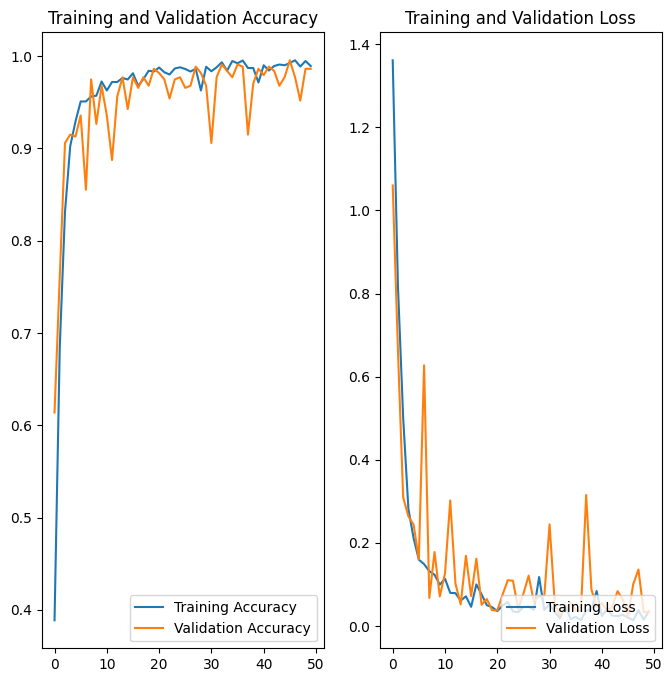

In [61]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label='Validation Loss')
plt.legend(loc='lower right')
plt.title("Training and Validation Loss")
plt.show()

Image to predict
Actual label:  Potato___Early_blight
1/1 [==============================] - 0s 377ms/step
Predicted label:  Potato___Early_blight


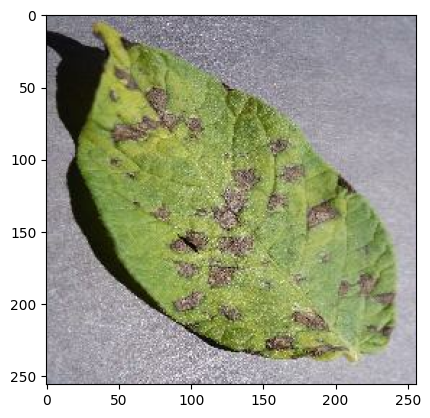

In [62]:
import numpy as np
for image_batch,label_batch in test_ds.take(1):
    first_image=image_batch[0].numpy().astype('uint8')
    first_label=label_batch[0].numpy()
    print("Image to predict")
    plt.imshow(first_image)
    print("Actual label: " ,class_names[first_label])
    batch_prediction=model.predict(image_batch)
    print("Predicted label: ",class_names[np.argmax(batch_prediction[0])])
    
    

In [30]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 28ms/step


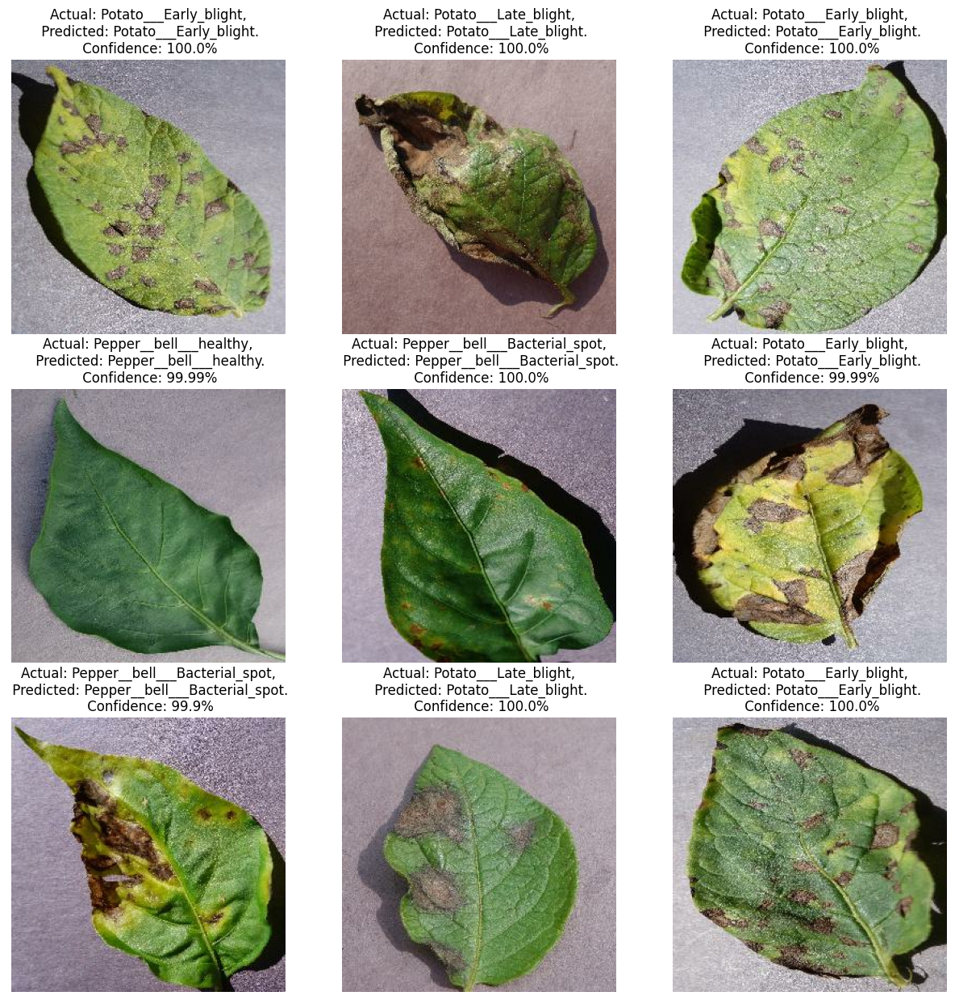

In [64]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [1]:
!pip install tensorflow-hub

  Obtaining dependency information for tensorflow-hub from https://files.pythonhosted.org/packages/6e/1a/fbae76f4057b9bcdf9468025d7a8ca952dec14bfafb9fc0b1e4244ce212f/tensorflow_hub-0.15.0-py2.py3-none-any.whl.metadata
  Using cached tensorflow_hub-0.15.0-py2.py3-none-any.whl.metadata (1.3 kB)
Using cached tensorflow_hub-0.15.0-py2.py3-none-any.whl (85 kB)


In [9]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
#from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob

In [12]:
IMAGE_SIZE=224
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)


Found 4627 files belonging to 5 classes.


In [74]:
IMAGE_SIZE=[224,224]
resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [75]:
for layer in resnet.layers:
    layer.trainable = False

In [76]:
folders = class_names=dataset.class_names

In [77]:
x = Flatten()(resnet.output)

In [78]:
len(folders)

5

In [79]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=resnet.input, outputs=prediction)

In [80]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [86]:
model.compile(
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
  optimizer='adam',
  metrics=['accuracy']
)

In [87]:
train_ds,val_ds,test_ds=get_dataset_partition(dataset)

In [88]:
r = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/20
116/116 [==============================] - 417s 3s/step - loss: 1.8063 - accuracy: 0.8995 - val_loss: 0.1280 - val_accuracy: 0.9770
Epoch 2/20
116/116 [==============================] - 934s 8s/step - loss: 0.2776 - accuracy: 0.9724 - val_loss: 0.2007 - val_accuracy: 0.9839
Epoch 3/20
116/116 [==============================] - 917s 8s/step - loss: 0.2479 - accuracy: 0.9795 - val_loss: 0.0988 - val_accuracy: 0.9799
Epoch 4/20
116/116 [==============================] - 945s 8s/step - loss: 0.0998 - accuracy: 0.9903 - val_loss: 0.0702 - val_accuracy: 0.9933
Epoch 5/20
116/116 [==============================] - 943s 8s/step - loss: 0.1088 - accuracy: 0.9903 - val_loss: 0.0151 - val_accuracy: 0.9955
Epoch 6/20
116/116 [==============================] - 943s 8s/step - loss: 0.1112 - accuracy: 0.9903 - val_loss: 0.0033 - val_accuracy: 0.9978
Epoch 7/20
116/116 [==============================] - 949s 8s/step - loss: 0.0504 - accuracy: 0.9943 - val_loss: 0.0104 - val_accuracy: 0.9978

In [89]:
scores=model.evaluate(test_ds)

15/15 [==============================] - 45s 3s/step - loss: 0.0000e+00 - accuracy: 1.0000


In [90]:
scores

[0.0, 1.0]

In [92]:
acc=r.history['accuracy']
val_acc=r.history['val_accuracy']
loss=r.history['loss']
val_loss=r.history['val_loss']

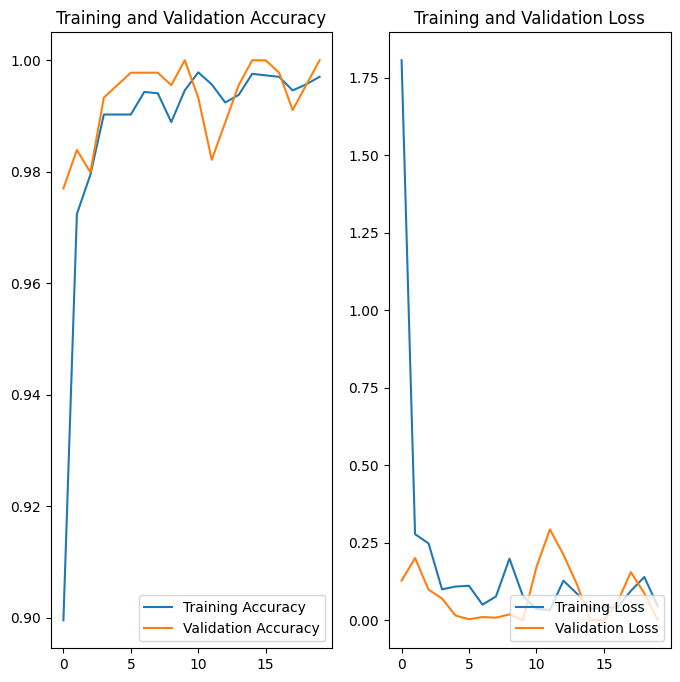

In [93]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label='Validation Loss')
plt.legend(loc='lower right')
plt.title("Training and Validation Loss")
plt.show()

1/1 [==============================] - 0s 187ms/step


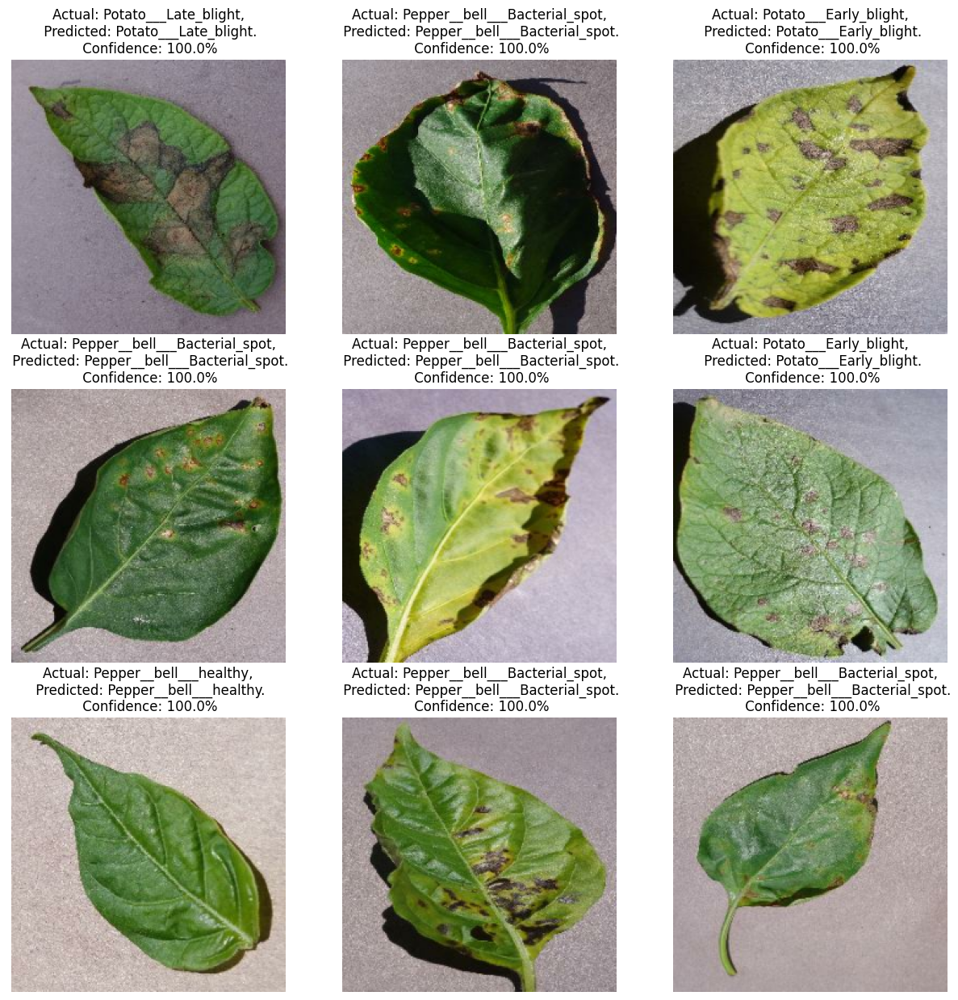

In [95]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [11]:
IMAGE_SIZE=[224,224]

inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

87910968/87910968 [==============================] - 165s 2us/step


In [12]:
for layer in inception.layers:
    layer.trainable = False

In [13]:
folders = class_names=dataset.class_names

In [14]:
x = Flatten()(inception.output)

In [15]:
len(folders)

5

In [16]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=inception.input, outputs=prediction)

In [17]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                             

 batch_normalization_99 (BatchN  (None, 25, 25, 64)  192         ['conv2d_99[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_101 (Batch  (None, 25, 25, 64)  192         ['conv2d_101[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_104 (Batch  (None, 25, 25, 96)  288         ['conv2d_104[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_105 (Batch  (None, 25, 25, 32)  96          ['conv2d_105[0][0]']             
 Normaliza

                                                                                                  
 batch_normalization_116 (Batch  (None, 25, 25, 64)  192         ['conv2d_116[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_116 (Activation)    (None, 25, 25, 64)   0           ['batch_normalization_116[0][0]']
                                                                                                  
 conv2d_114 (Conv2D)            (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_117 (Conv2D)            (None, 25, 25, 96)   55296       ['activation_116[0][0]']         
                                                                                                  
 batch_nor

                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_120[0][0]',         
                                                                  'activation_123[0][0]',         
                                                                  'max_pooling2d_6[0][0]']        
                                                                                                  
 conv2d_128 (Conv2D)            (None, 12, 12, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_128 (Batch  (None, 12, 12, 128)  384        ['conv2d_128[0][0]']             
 Normaliza

                                                                  'activation_133[0][0]']         
                                                                                                  
 conv2d_138 (Conv2D)            (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_138 (Batch  (None, 12, 12, 160)  480        ['conv2d_138[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_138 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_138[0][0]']
                                                                                                  
 conv2d_139 (Conv2D)            (None, 12, 12, 160)  179200      ['activation_138[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 conv2d_149 (Conv2D)            (None, 12, 12, 160)  179200      ['activation_148[0][0]']         
                                                                                                  
 batch_normalization_149 (Batch  (None, 12, 12, 160)  480        ['conv2d_149[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_149 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_149[0][0]']
          

                                                                                                  
 batch_normalization_159 (Batch  (None, 12, 12, 192)  576        ['conv2d_159[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_159 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_159[0][0]']
                                                                                                  
 conv2d_155 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_160 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_159[0][0]']         
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_164 (Conv2D)            (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_168 (Conv2D)            (None, 12, 12, 192)  258048      ['activation_167[0][0]']         
                                                                                                  
 batch_normalization_164 (Batch  (None, 12, 12, 192)  576        ['conv2d_164[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_168 (Batch  (None, 12, 12, 192)  576        ['conv2d_168[0][0]']             
 Normalization)                                                                                   
          

 batch_normalization_170 (Batch  (None, 5, 5, 320)   960         ['conv2d_170[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_172 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_172[0][0]']
                                                                                                  
 activation_173 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_173[0][0]']
                                                                                                  
 activation_176 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_176[0][0]']
                                                                                                  
 activation_177 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_177[0][0]']
          

                                                                                                  
 activation_185 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_185[0][0]']
                                                                                                  
 activation_186 (Activation)    (None, 5, 5, 384)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 batch_normalization_187 (Batch  (None, 5, 5, 192)   576         ['conv2d_187[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_179 (Activation)    (None, 5, 5, 320)    0           ['batch_normalization_179[0][0]']
                                                                                                  
 mixed9_1 

In [18]:
model.compile(
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
  optimizer='adam',
  metrics=['accuracy']
)

In [20]:
train_ds,val_ds,test_ds=get_dataset_partition(dataset)

In [22]:
EPOCHS=20
i = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/20
116/116 [==============================] - 287s 2s/step - loss: 62.3843 - accuracy: 0.6029 - val_loss: 26.7421 - val_accuracy: 0.6674
Epoch 2/20
116/116 [==============================] - 247s 2s/step - loss: 22.7923 - accuracy: 0.7223 - val_loss: 28.1631 - val_accuracy: 0.7210
Epoch 3/20
116/116 [==============================] - 245s 2s/step - loss: 26.6990 - accuracy: 0.7456 - val_loss: 15.1792 - val_accuracy: 0.8013
Epoch 4/20
116/116 [==============================] - 245s 2s/step - loss: 16.9315 - accuracy: 0.8089 - val_loss: 6.3926 - val_accuracy: 0.8951
Epoch 5/20
116/116 [==============================] - 245s 2s/step - loss: 12.3210 - accuracy: 0.8348 - val_loss: 18.5862 - val_accuracy: 0.7902
Epoch 6/20
116/116 [==============================] - 245s 2s/step - loss: 13.3394 - accuracy: 0.8429 - val_loss: 5.1248 - val_accuracy: 0.9011
Epoch 7/20
116/116 [==============================] - 245s 2s/step - loss: 16.5844 - accuracy: 0.8235 - val_loss: 48.3365 - val_accu

In [23]:
scores=model.evaluate(test_ds)

15/15 [==============================] - 30s 2s/step - loss: 2.4170 - accuracy: 0.9615


In [24]:
scores

[2.4170472621917725, 0.9614561200141907]

In [25]:
acc=i.history['accuracy']
val_acc=i.history['val_accuracy']
loss=i.history['loss']
val_loss=i.history['val_loss']

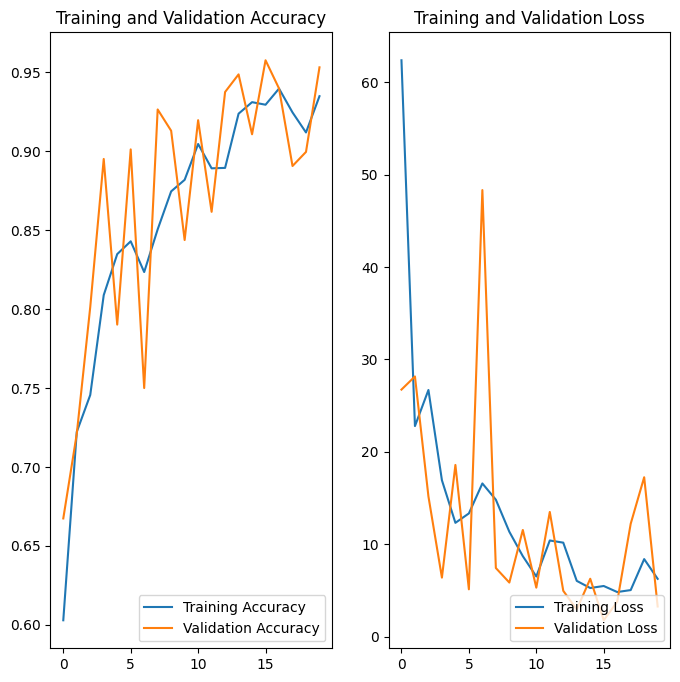

In [26]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label='Validation Loss')
plt.legend(loc='lower right')
plt.title("Training and Validation Loss")
plt.show()

1/1 [==============================] - 0s 125ms/step


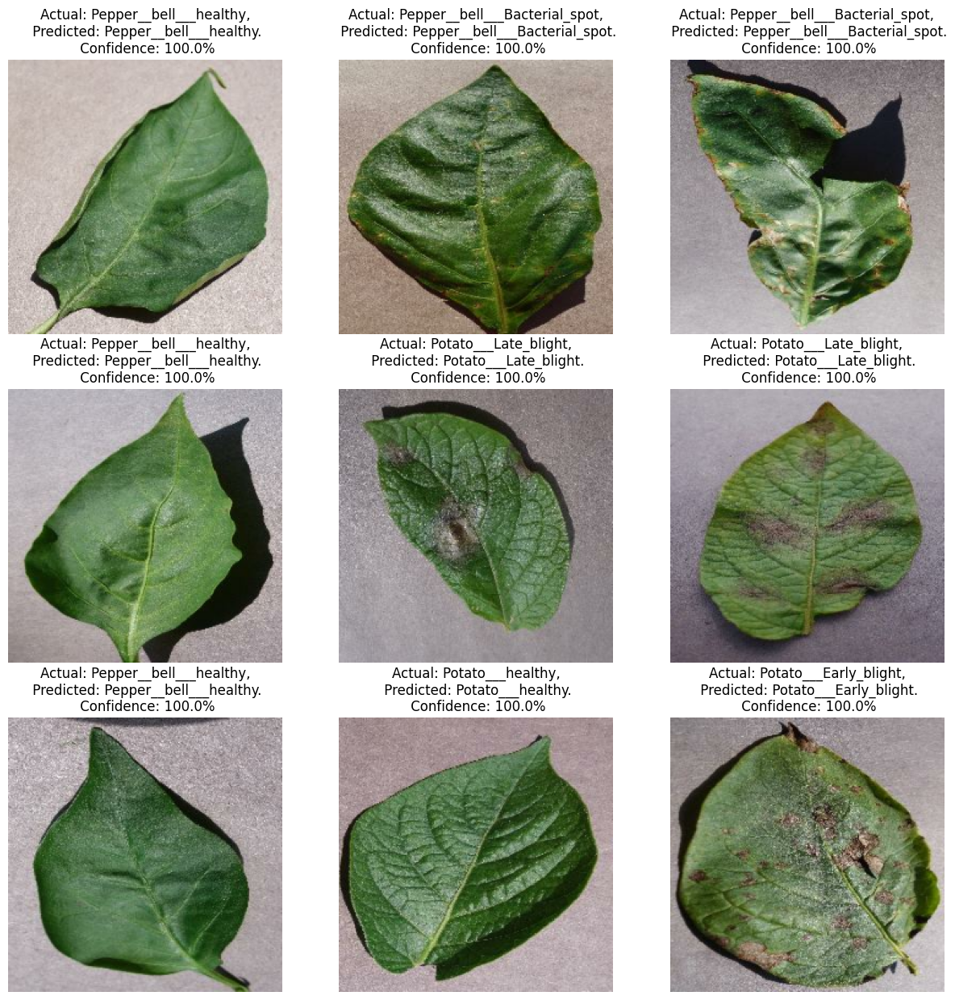

In [29]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [13]:
IMAGE_SIZE=[224,224]
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

58889256/58889256 [==============================] - 27s 0us/step


In [14]:
for layer in vgg.layers:
    layer.trainable = False

In [15]:
folders = class_names=dataset.class_names

In [16]:
x = Flatten()(vgg.output)

In [18]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=vgg.input, outputs=prediction)

In [19]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [20]:
model.compile(
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
  optimizer='adam',
  metrics=['accuracy']
)

In [22]:
train_ds,val_ds,test_ds=get_dataset_partition(dataset)

In [23]:
EPOCHS=20
v = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/20
116/116 [==============================] - 435s 4s/step - loss: 2.1396 - accuracy: 0.8887 - val_loss: 1.4084 - val_accuracy: 0.9540
Epoch 2/20
116/116 [==============================] - 413s 4s/step - loss: 0.6925 - accuracy: 0.9659 - val_loss: 0.1921 - val_accuracy: 0.9885
Epoch 3/20
116/116 [==============================] - 422s 4s/step - loss: 0.3565 - accuracy: 0.9786 - val_loss: 0.3009 - val_accuracy: 0.9866
Epoch 4/20
116/116 [==============================] - 419s 4s/step - loss: 0.3342 - accuracy: 0.9819 - val_loss: 0.1514 - val_accuracy: 0.9888
Epoch 5/20
116/116 [==============================] - 418s 4s/step - loss: 0.1840 - accuracy: 0.9900 - val_loss: 0.1365 - val_accuracy: 0.9911
Epoch 6/20
116/116 [==============================] - 423s 4s/step - loss: 0.1738 - accuracy: 0.9897 - val_loss: 0.3096 - val_accuracy: 0.9799
Epoch 7/20
116/116 [==============================] - 420s 4s/step - loss: 0.1556 - accuracy: 0.9895 - val_loss: 5.3218e-10 - val_accuracy: 1.

In [25]:
scores=model.evaluate(test_ds)

15/15 [==============================] - 44s 3s/step - loss: 0.0000e+00 - accuracy: 1.0000


In [26]:
scores

[0.0, 1.0]

In [28]:
acc=v.history['accuracy']
val_acc=v.history['val_accuracy']
loss=v.history['loss']
val_loss=v.history['val_loss']

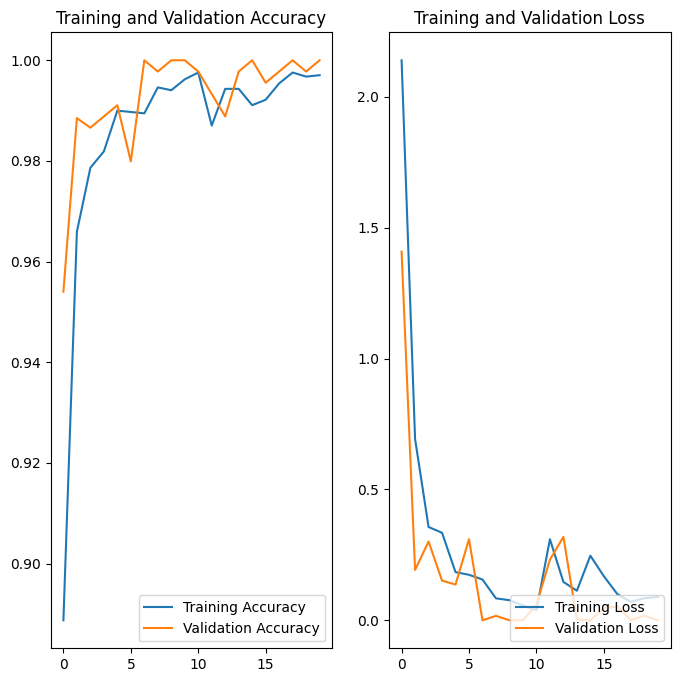

In [29]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label='Validation Loss')
plt.legend(loc='lower right')
plt.title("Training and Validation Loss")
plt.show()

1/1 [==============================] - 0s 140ms/step


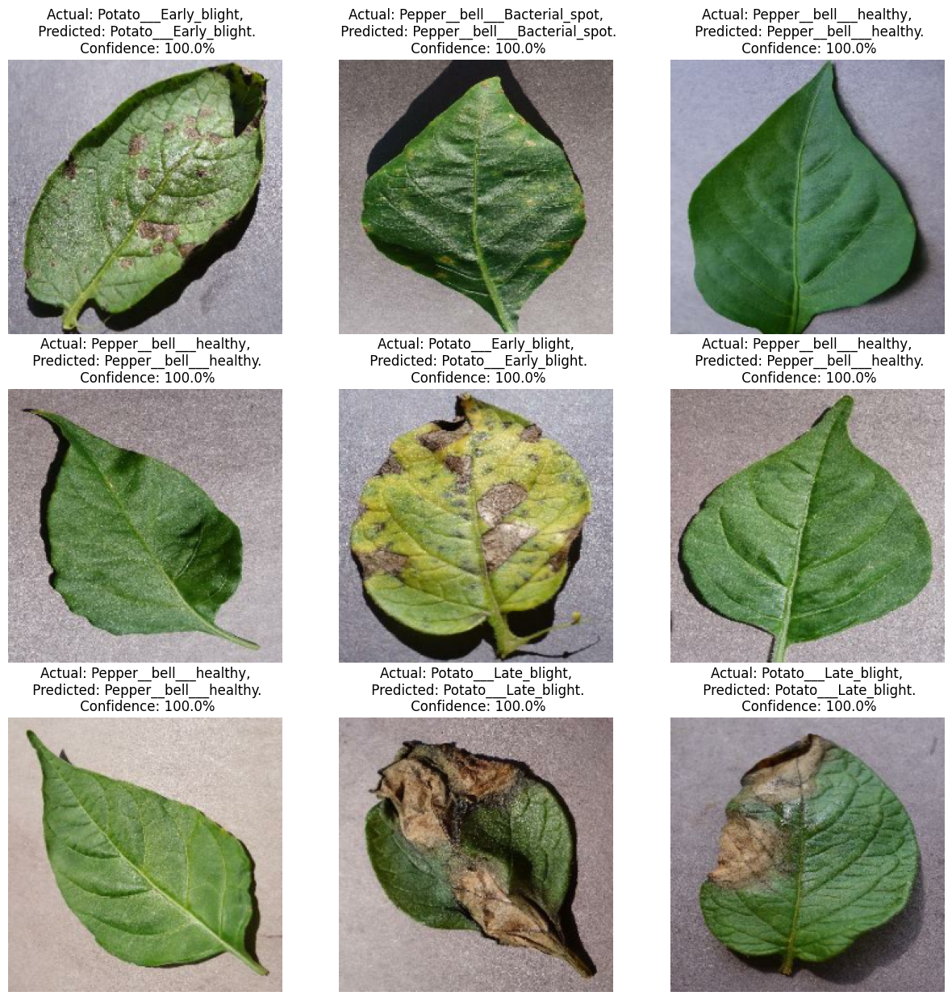

In [31]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")